<a href="https://colab.research.google.com/github/btcain44/Applied_Deep_Learning/blob/main/UNET_Melanoma.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Bi-Weekly Report #7
### Brian Cain
#### UNET_Melanoma.ipynb

This week I will be applying concepts covered in the <b>Semantic Segmentation</b> module covered in class. Specifically I will dive into using the <b>U-Net</b> model to perform semantic segmentation on a skin cancer dataset. 

Within this notebook, I will be using data from the ISIC Archive (https://www.isic-archive.com/#!/topWithHeader/wideContentTop/main). This archive is the premier data source for skin cancer imaging and contains various types of skin cancer. Specifically I am interesting in Melanoma skin cancer for this notebook and thus I will focus on pulling in and modeling this data. 

NOTE: I was only able to pull in 400 images from my dataset, otherwise Collab ended my runtime due to over-using the Ram (I am paying for collab so this was slightly annoying but oh well!). The images are fairly high-resolution so it makes sense that they took a lot of Ram. 

#### Data Wrangling

In the following section, I will pull in both image and segmentation data for Melanoma skin cancer images. 

In [ ]:
##Import api package necessary to work with the ISIC archive
import requests
import cv2

##Import package we will use to store image information
import pandas as pd
import numpy as np

<b>Obtain Image Meta-Data:</b>

Below I define a function that pulls in the image meta-data and the dataset that the images come from. It then places this information into a dataframe. 

In [ ]:
##Define a new function based off that information
def compile_img_info():
    
    imgData,datasetData = [],[]
    imgInfo = requests.get('https://isic-archive.com/api/v1/image?limit=400&sort=name&sortdir=1&detail=true')
    imgInfo = imgInfo.json()
    for i in imgInfo:
        
        ##Compile information on images
        dataEntry = []
        imgId = i['_id']
        imgName = i['name']
        imgDataset = i['dataset']['_id']
        imgDisease = i['meta']['clinical']['benign_malignant']
        imgDiagnosis = i['meta']['clinical']['diagnosis']
        imgMelanocytic = i['meta']['clinical']['melanocytic']
        dataEntry = [imgId,imgName,imgDataset,imgDisease,imgDiagnosis,imgMelanocytic]
        imgData.append(dataEntry)
        
        ##Compile information on datasets
        datasetName = i['dataset']['description']
        datasetId = i['dataset']['_id']
        if datasetData.count([datasetName,datasetId]) == 0:
            datasetData.append([datasetId,datasetName])
            
    ##Write the two data lists into dataframes
    imgDf = pd.DataFrame(imgData,columns = ['id','name','dataset_Id','imgDisease','imgDiagnosis','melanocytic'])
    datasetDf = pd.DataFrame(datasetData,columns = ['id','dataset_name'])
    
    ##Return the dataframes
    return imgDf,datasetDf

In [ ]:
##Call the function to evaluate if it has worked
imgDf,datasetDf = compile_img_info()

Now lets display the meta-data that has been pulled in for the desired melanoma skin lesion images. 

In [ ]:
##Display the results of the image dataframe
imgDf.head(5)

,id,name,dataset_Id,imgDisease,imgDiagnosis,melanocytic
0,5436e3abbae478396759f0cf,ISIC_0000000,5a2ecc5e1165975c945942a2,benign,nevus,True
1,5436e3acbae478396759f0d1,ISIC_0000001,5a2ecc5e1165975c945942a2,benign,nevus,True
2,5436e3acbae478396759f0d3,ISIC_0000002,5a2ecc5e1165975c945942a2,malignant,melanoma,True
3,5436e3acbae478396759f0d5,ISIC_0000003,5a2ecc5e1165975c945942a2,benign,nevus,True
4,5436e3acbae478396759f0d7,ISIC_0000004,5a2ecc5e1165975c945942a2,malignant,melanoma,True


Below we can see the information that we have on the images. Below is a summarization of the fields based off some exploration I did in addition to pulling the data in:
* <b>id - </b>Unique primary key that identifies an individual image
* <b>name - </b>Name assigned to the image by the ISIC archive
* <b>dataset_Id - </b>Unique identifier for the dataset an image is from. Its important to have this as the ISIC archive images are comprised of images from many different dermatology datasets worldwide
* <b>imgDisease - </b>Field identifying if a skin lesion is benign (non-cancerous) or malignant (cancerous)
* <b>imgDiagnosis - </b>Field identifying what a professional dermatologist identified the lesion as
* <b>melanocytic - </b>Field identifying if the lesion is melanocytic (has rapid growth)

Lets quickly explore how many datasets comprise the images I just pulled in:

In [ ]:
#Display the datasets the data is from
for i in range(len(datasetDf.dataset_name.unique())):
  print('Dataset '+str(i+1)+': '+datasetDf.dataset_name.unique()[i])
  print('-----------------------------------------------------------')

Dataset 1: Moles and melanomas.
Biopsy-confirmed melanocytic lesions. Both malignant and benign lesions are included.
-----------------------------------------------------------


Looks like the data we pulled in is from a single dataset, so we don't have to be overly concerned about dataset inconsistency for now. Lets now display the unique meta-data values for a couple fields that we have particular interest in. 

In [ ]:
##Display the unique values of each metadata field
for i in imgDf[['imgDisease','imgDiagnosis','melanocytic']].columns:
  uniques = imgDf[i].unique()
  print('Column '+i+' has unique values'+str(uniques))

Column imgDisease has unique values['benign' 'malignant']
Column imgDiagnosis has unique values['nevus' 'melanoma' None]
Column melanocytic has unique values[True None]


We can see that the melanocytic column has unique values of True, and None. Since I am particularly interested in segmentation for melanoma skin cancer, I will filter our image meta-data to only include melanocytic type cancers. 

In [ ]:
##Filter dataset to only be melanocytic
imgDf = imgDf[imgDf['melanocytic']==True]

In [ ]:
##Display the observations remaining in the dataframe
print('Observations remaining in Dataset: '+str(len(imgDf)))

Observations remaining in Dataset: 399


Luckily, filtering the dataset by Melanocytic only got rid of one observation, so we retain almost all of the original data. 

<b>Obtain Actual Image Data:</b>

Below I have written a function that will pull in dermascopic skin lesion images as numpy arrays. (I've found this semester I prefer working with images as numpy arrays.) It will only pull in images that we have retained meta-data for. 

In [ ]:
##Define a function to save the images in the dataframe to a file location
def obtainData(imgDf):

  ##Create storage location to put images in 
  melImages = {}
  
  ##Iterate through image ids to download them
  for index, row in imgDf.iterrows():
      imgId, imgName = row['id'], row['name']
      resp = requests.get('https://isic-archive.com/api/v1/image/' + imgId + '/download?contentDisposition=attachment', 
                                stream=True).raw
      img = np.asarray(bytearray(resp.read()), dtype="uint8")
      img = cv2.imdecode(img, cv2.IMREAD_COLOR) ##decodes into BGR order for color channel
      img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
      melImages[imgName] = img

  return melImages

In [ ]:
##Store the numpy array images in a list
images = obtainData(imgDf)

<b>Obtain Segmentation Meta-Data</b>

ISIC Archive also supplies some nice human-made segmentations for each skin lesion image. This is simply a binary segmentation for each image identifying which pixels are in the background healthy skin and which images are in the lesion itself. 

Below I've written a function that obtains the image segmentations meta-data. Not all images have a created segmentation, so this dataframe will indicate for each image if a segmentation exists and gather information about that segmentation. 

In [ ]:
##Create a function that obtains the segmentations from ISIC archives if they exist
##NOTE: Function is malleable enough to either create new dataframe or return records and append to existing dataframe 
def get_image_segmentation_info(img_id_list):
    
    ##Go through each image we'd like to find the segmentation for
    segmentationData = []
    for img_id in img_id_list:
        
        ##Only proceed with this step if we do not run into an error
        segInfo = requests.get('https://isic-archive.com/api/v1/segmentation?limit=50&sort=created&sortdir=-1&imageId='+img_id)
        if segInfo.status_code == 200:
            
            ##Indicate in main dataframe that segmentation for image does exist
            imgDf.loc[imgDf['id']==img_id,'segmentation_exist'] = True
            
            ##Put information into json format
            segInfo = segInfo.json()

            ##Compile information on the segmentation
            dataEntry = []
            segId = segInfo[0]['_id']
            segStatus = segInfo[0]['failed']
            segSkill = segInfo[0]['skill']
            dataEntry = [segId,img_id,segSkill,segStatus]

            ##Use api to request more information about the image
            segAdd_Info = requests.get('https://isic-archive.com/api/v1/segmentation/'+segId)
            segAdd_Info = segAdd_Info.json()
            segReviews_count = len(segAdd_Info['reviews']) 
            segReviews_approved = sum([1 for x in segAdd_Info['reviews'] if x['approved']==True])
            segReviews_unapproved = segReviews_count - segReviews_approved
            segReview_skill = [x['skill'] for x in segAdd_Info['reviews']]
            dataEntry.extend([segReviews_count,segReviews_approved, ##add information to data entry for segmentation table
                             segReviews_unapproved,segReview_skill])
            
            ##Add data to segmentation data
            segmentationData.append(dataEntry)
        
        ##Assign that there is no segmentation in existence for the image
        else:
            imgDf.loc[imgDf['id']==img_id,'segmentation_exist'] = False
            
    ##Return our newly attained segmentation data
    return segmentationData

In [ ]:
##Call function and save results to new segmentation dataframe
img_id_list = imgDf['id'].tolist()
segmentationData = get_image_segmentation_info(img_id_list)

segmentationDf = pd.DataFrame(segmentationData,
                              columns = ['segId','img_id','segSkill','segStatus',
                                          'segReviews_count','segReviews_approved',
                                          'segReviews_unapproved','segReview_skill'])

Let's similarly examine what some of this meta-data looks like:

In [ ]:
##Display segmentationDf to see the results
segmentationDf.head(5)

,segId,img_id,segSkill,segStatus,segReviews_count,segReviews_approved,segReviews_unapproved,segReview_skill
0,5463934bbae47821f88025ad,5436e3abbae478396759f0cf,expert,False,2,2,0,"[novice, expert]"
1,545d0fadbae47821f880257b,5436e3acbae478396759f0d1,expert,False,2,2,0,"[novice, expert]"
2,545d0c6bbae47821f880256c,5436e3acbae478396759f0d3,expert,False,2,2,0,"[novice, expert]"
3,545d0aeabae47821f880255c,5436e3acbae478396759f0d5,expert,False,2,2,0,"[novice, expert]"
4,54ea8ac3bae47871b5e00cd2,5436e3acbae478396759f0d7,expert,False,1,1,0,[expert]


Above we can note a few fields that have been pulled in for the image data:
* <b>segSkill - </b>Skill of the person drawing the segmentation
* <b>segStatus - </b>When true, the segmentation is considered a failure (not good enough, so we want False)
* <b>segReviews_count - </b>How many people reviewed the segmentation
* <b>segReviews_approved - </b>How many of the reviewers approved the segmentation (segReviews_unapproved is visibly the opposite of this)
* <b>segReview_skill - </b>The "skill" of the person reviewing the segmentation as deemed by the ISIC archive 

We can also note that the segmentation Meta-Data function above altered the Image meta-data dataframe and added a Segmentation_Exist column to it to indicate if for a given image, the segmentation exists. Below I've displayed this functionality.

In [ ]:
##Display a few examples to show the data formatting step indicating if a segmentation exists
imgDf[['id','name','segmentation_exist']].head()

,id,name,segmentation_exist
0,5436e3abbae478396759f0cf,ISIC_0000000,True
1,5436e3acbae478396759f0d1,ISIC_0000001,True
2,5436e3acbae478396759f0d3,ISIC_0000002,True
3,5436e3acbae478396759f0d5,ISIC_0000003,True
4,5436e3acbae478396759f0d7,ISIC_0000004,True


<b>Obtain Actual Image Segmentations</b>

Now I will pull in the actual segmentations, again as numpy arrays. 



In [ ]:
##Define a function to save the images in the dataframe to a file location
def obtainData_segmentation(segmentationDf,imgDf):
  
  ##Establish storage location for segmentations
  segImages = {}

  ##Request api for segmentation images obtained in prior step
  for index, row in segmentationDf.iterrows():
      segId = row['segId']
      imgId = row['img_id']
      imgName = imgDf.loc[imgDf['id']==imgId,'name'].tolist()[0]
      resp = requests.get('https://isic-archive.com/api/v1/segmentation/'+segId+'/mask?contentDisposition=attachment',
                          stream=True).raw

      ##Save the picture to directory 
      ##CODE OBTAINED: https://stackoverflow.com/questions/50948061/how-to-save-or-download-an-image-that-i-get-in-a-request-python
      image = np.asarray(bytearray(resp.read()), dtype="uint8")
      image = cv2.imdecode(image, cv2.IMREAD_UNCHANGED)
      segImages[imgName] = image

  return segImages

In [ ]:
##Pull in the segmentations into a dictionary
segmentations = obtainData_segmentation(segmentationDf,imgDf)

This concludes our data wrangling step. Here is a brief wrap-up of whats been accomplished:
* Meta-Data obtained for Images from ISIC API
* Image Data obtained from ISIC API
* Meta-Data obtained for Segmentations from ISIC API
* Segmentation Data obtained from ISIC API

This step was really useful in that for the majority of the semester, I easily imported tensorflow datasets from a couple lines of code. By going outside of tensorflow for a dataset, I learned lessions in how to build a data API pipeline for both actual image data and meta-data. 

### Exploratory Data Analysis

Now that we have the data, lets do some EDA to get a better feel of what the images and the segmentations look like. 

Let's plot some of the images and their corresponding segmentations. 

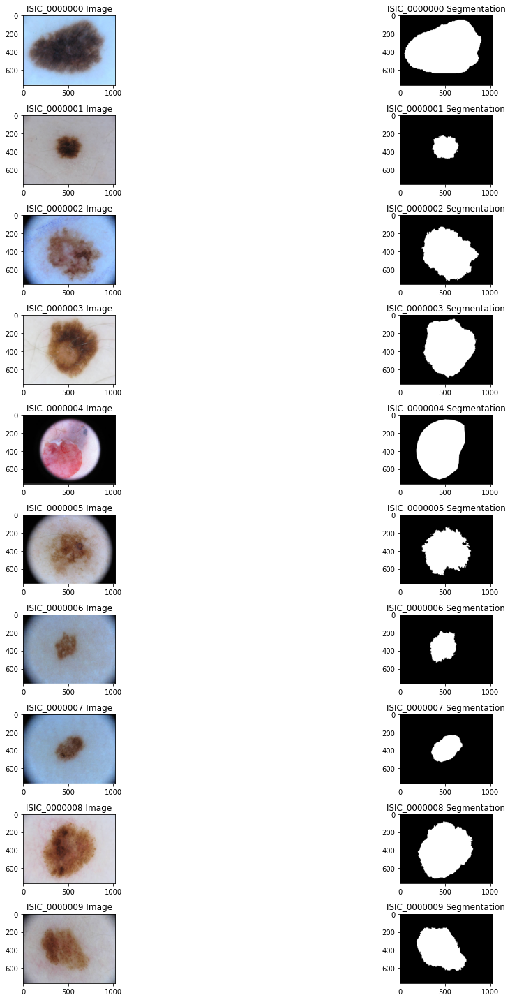

In [ ]:
##Import necessary plotting package
import matplotlib.pyplot as plt

##Create figure to output images onto
rows = 10
columns = 2
fig, ax = plt.subplots(rows,columns,figsize=(20,20))

##Iterate through the first ten images in dictionary and display results
ct = 0
for i in images.keys():

  ##Plot the melanoma image and its segmentation
  ax[ct,0].imshow(images[i])
  ax[ct,1].imshow(segmentations[i],cmap='gray')

  ##Set the titles
  ax[ct,0].set_title(i+' Image')
  ax[ct,1].set_title(i+' Segmentation')
  
  ##Logic to keep loop going until we've plotted all observations
  if ct == 9:
    break
  else:
    ct+=1

##Format the plot
fig.tight_layout()

We can notice a few observations from the segmentations plotted above:
* For the ISIC_000004 Segmentation, we can notice that the left half of the segmentation closely follows the circular shape of the lens, this could be problematic
  * A note based on this, is that for several images like ISIC_0004, ISIC_0005, ISIC_0006 the lens of the camera interferes more with the photo than in other examples, this might be a consideration to remember
* Most of the segmentations appear to be detailed at the boundary of the lesion which is good, because for example, if we would like to model a lesion with handcrafted features we would like to have a very detailed, well-defined boundary



```
# This is formatted as code
```

To continue EDA lets try breaking down the image data into tabular data, much like people have done for classifying the IRIS dataset for petal length/etc. 

Due to more Ram limitations, I was not able to get a datapoint for every pixel in every image, or our dataset would be exponentially large. Instead, I defined a function that takes an argument named <b>numDataPoints</b>, we will use this number to go randomly grab that number of pixels randomly across all images. For example, below I used numDataPoints=100000, so my dataset contains 100,000 pixels datapoints selected randomly across all 399 images we have. This seemed like the best way to have a dataset thats not biased towards a particular subgroup of images. 

In [ ]:
##Import necessary packages
import random

##Now create a dataframe that we can run a segmentation algorithm on (0=black,255=white)
def create_segmentation_datapoints(segData,segmentationDf,imgDf,imgData,numDataPoints):
    
    segmentationModel_data = []
    
    ##Loop through all keys (will use approach of segmentation from 
    ##Automated Melanoma Recognition in Dermoscopy Images via Very Deep Residual Networks - 2016)
    ##Where every pixel is a training sample
    for i in range(numDataPoints+1):
        
        ##Determine information about the image
        img_name = random.choice(list(images))
        img_id = imgDf.loc[imgDf['name']==img_name,'id'].tolist()[0] 

        y=random.randint(0, imgData[img_name].shape[0]-1)
        x=random.randint(0, imgData[img_name].shape[1]-1)

        r,g,b = imgData[img_name][y,x][0],imgData[img_name][y,x][1],imgData[img_name][y,x][2]

        if segData[img_name][y,x] != 0: ##Lesion = 1 if pixel is part of lesion, 0 otherwise
          lesion = 1
        else:
          lesion = 0

        segmentationModel_data.append([img_id,lesion,x,y,r,g,b])
        
    ##Return the segmentation data to use to train a segmentation model
    return segmentationModel_data

Below I have created and displayed the tabular data obtained from 100,000 randomly selected pixels. 

In [ ]:
##Create dataframe containing segmentation training data based on function
segmentationModel_data = create_segmentation_datapoints(segmentations,segmentationDf,imgDf,images,100000)
segmentationModel_df = pd.DataFrame(segmentationModel_data,
                              columns=['img_id','lesion','pixel_x_coord',
                                        'pixel_y_coord','r','g','b'])

##Display the dataframe to ensure results
segmentationModel_df.head()

,img_id,lesion,pixel_x_coord,pixel_y_coord,r,g,b
0,5436e3babae478396759f1a9,0,802,51,207,170,162
1,5436e3adbae478396759f0f7,0,1346,527,190,157,164
2,5436e3dcbae478396759f3db,1,1036,1245,206,135,113
3,5436e3cdbae478396759f2bb,1,433,484,165,121,110
4,5436e3f2bae478396759f482,0,835,468,174,164,165


We can see that the obtained fields are pretty simple in nature. We have obtained the x and y-coordinate locations of each image pixel, and as well their r, g, b values at that pixel. Additionally, the lesion field takes on a value of 1 if it inside the skin lesion, and a value of 0 if it is part of the background healthy skin. This lesion variable is our target variable we want to predict for semantic segmentation. 

### Building a Lackluster Segmentation Model

In order to appreciate any results obtained from U-Net semantic segmentation, I first wanted to build a much more naive approach to semantic segmentation on the skin cancer dataset to be able to contrast the results of the two. 

I will build a couple of Support Vector Machines on this tabular data created for the images and assess how they perform on this image segmentation task. 

Below we will normalize the following covariates on a scale from 0-1 as normalization enhances SVM performance: {pixel_x_coord,pixel_y_coord,r,g,b}.

In [ ]:
##Normalize R,G,B data on 0-1 scale
segmentationModel_df['r'] = segmentationModel_df['r']/255
segmentationModel_df['g'] = segmentationModel_df['g']/255
segmentationModel_df['b'] = segmentationModel_df['b']/255
segmentationModel_df.head()

##Normalize the pixel coordinate data
shapeDict = {}
for i in segmentationModel_df['img_id'].unique().tolist():
    img_name = imgDf.loc[imgDf['id']==i,'name'].tolist()[0]
    shapeDict[i] = [images[img_name].shape[0], images[img_name].shape[1]]
    
segmentationModel_df['img_shape'] = (segmentationModel_df['img_id'].map(shapeDict))
segmentationModel_df[['shape_y','shape_x']] = (pd.DataFrame(segmentationModel_df.img_shape.tolist(),
                                                           index=segmentationModel_df.index))
segmentationModel_df['pixel_x_coord'] = (segmentationModel_df['pixel_x_coord']/
                                         segmentationModel_df['shape_x'])
segmentationModel_df['pixel_y_coord'] = (segmentationModel_df['pixel_y_coord']/
                                         segmentationModel_df['shape_y'])

##Now lets display what the new normalized data looks like
segmentationModel_df.head()

,img_id,lesion,pixel_x_coord,pixel_y_coord,r,g,b,img_shape,shape_y,shape_x
0,5436e3babae478396759f1a9,0,0.391602,0.033203,0.811765,0.666667,0.635294,"[1536, 2048]",1536,2048
1,5436e3adbae478396759f0f7,0,0.894947,0.466785,0.745098,0.615686,0.643137,"[1129, 1504]",1129,1504
2,5436e3dcbae478396759f3db,1,0.337240,0.540365,0.807843,0.529412,0.443137,"[2304, 3072]",2304,3072
3,5436e3cdbae478396759f2bb,1,0.422852,0.630208,0.647059,0.474510,0.431373,"[768, 1024]",768,1024
4,5436e3f2bae478396759f482,0,0.908596,0.583541,0.682353,0.643137,0.647059,"[802, 919]",802,919


Lets split the tabular data into a training and validation set. I will use other images from the dataset as test data to visually examine how the model is working. 

In [ ]:
##Train a segmentation model
x = segmentationModel_df[['pixel_x_coord','pixel_y_coord','r','g','b']]
y = segmentationModel_df['lesion']

from sklearn.model_selection import train_test_split
train_x, val_x, train_y, val_y = train_test_split(x, y, 
                                                  random_state = 0, ##random seed set for reproducible results
                                                  test_size = .70)

Now I will use some code that I have previously used for Predictive Analytics projects in the past that has worked well for me. Essentially it is the following:
* Trains a Linear, Polynomial d=2, Polynomial d=3, and RBF Support vectore machine
* Cross validates over C parameter values of .1-1.4 to see which fit works the best on validation data
* Prints final results of each model on test data from an optimal C
* I also set a probability=True parameter so that we can have probabilities if we want

In [ ]:
##Use a random seed from numpy so we can replicate results
np.random.seed(5)

##Import support vector machine module form sklearn
from sklearn import svm

##Set up a grid search for the optimal c values
c = [.2,.4,.6,.8,1,1.2,1.4]

##Create storage location for fitted models
linear = []
polynomial2 = []
polynomial3 = []
rbf = []

##Fit each model at every c value
for i in c:
    
    ##Instantiate all the models at the c values
    linear_svc = svm.SVC(C=i,kernel='linear',probability=True)
    polynomial2_svc = svm.SVC(C=i,kernel='poly',degree=2,probability=True)  
    polynomial3_svc = svm.SVC(C=i,kernel='poly',degree=3,probability=True) 
    rbf_svc = svm.SVC(C=i,kernel='rbf',probability=True)
    
    ##Fit each model and add it to the model storage locations
    linear.append(linear_svc.fit(train_x,train_y))
    polynomial2.append(polynomial2_svc.fit(train_x,train_y))
    polynomial3.append(polynomial3_svc.fit(train_x,train_y))
    rbf.append(rbf_svc.fit(train_x,train_y))
    
##Store the accuracies of each fitted models so we can evaluate which c value optimized each model
linear_acc = []
polynomial2_acc = []
polynomial3_acc = []
rbf_acc = []

##Obtain accuracy scores for the models
from sklearn.metrics import accuracy_score
classReports = []
for i,j,g,k in zip(linear,polynomial2,polynomial3,rbf):
    
    ##Get the accuracies for the models
    predicted_y_i = i.predict(val_x)
    predicted_y_j = j.predict(val_x)
    predicted_y_g = g.predict(val_x)
    predicted_y_k = k.predict(val_x)
    
    ##Store all of the accuracies
    linear_acc.append(accuracy_score(val_y,predicted_y_i))
    polynomial2_acc.append(accuracy_score(val_y,predicted_y_j))
    polynomial3_acc.append(accuracy_score(val_y,predicted_y_g))
    rbf_acc.append(accuracy_score(val_y,predicted_y_k))
    
##Determine which index for each model type has the highest accuracy
linear_index = (-np.array(linear_acc)).argsort()[:1].item()
polynomial2_index = (-np.array(polynomial2_acc)).argsort()[:1].item()
polynomial3_index = (-np.array(polynomial3_acc)).argsort()[:1].item()
rbf_index = (-np.array(rbf_acc)).argsort()[:1].item()

##Compute the confusion matrices of the most accurate SVM's
from sklearn.metrics import confusion_matrix
linear_confusion = confusion_matrix(val_y,linear[linear_index].predict(val_x))
polynomial2_confusion = confusion_matrix(val_y,polynomial2[polynomial2_index].predict(val_x))
polynomial3_confusion = confusion_matrix(val_y,polynomial3[polynomial3_index].predict(val_x))
rbf_confusion = confusion_matrix(val_y,rbf[rbf_index].predict(val_x))

##Display the results for each type of SVM model (Accuracy, Sensitivity, Specificity)
#c11 tp c01 fp, sensitivity = % true positive 
#c00 tn, c10 fn, specificty = % true negatives
print('SVM Results ----------------- \n')
model_names = ['Linear', 'Polynomial Degree 2', 'Polynomial Degree 3', 'RBF']
model_lists = [linear,polynomial2,polynomial3,rbf]
optimal_models = [linear_index,polynomial2_index,polynomial3_index,rbf_index]
for i in range(4):
    
    ##Compute the statistics for the model
    pred_y = model_lists[i][optimal_models[i]].predict(val_x)
    accuracy = accuracy_score(val_y,pred_y)
    confusion = confusion_matrix(val_y,pred_y)
    sensitivity = confusion[1][1]/(confusion[1][1]+confusion[0][1])
    specificity = confusion[0][0]/(confusion[0][0]+confusion[1][0])
    
    ##Display the models information and results
    print(model_names[i]+' SVM with C='+str(c[optimal_models[i]]))
    print('Accuracy = '+str(round(accuracy,4)))
    print('Sensitivity = '+str(round(sensitivity,4)))
    print('Specificity = '+str(round(specificity,4)))
    print('---------------------- \n')

SVM Results ----------------- 

Linear SVM with C=0.2
Accuracy = 0.815
Sensitivity = 0.7685
Specificity = 0.8341
---------------------- 

Polynomial Degree 2 SVM with C=0.2
Accuracy = 0.8701
Sensitivity = 0.8496
Specificity = 0.879
---------------------- 

Polynomial Degree 3 SVM with C=1.4
Accuracy = 0.8714
Sensitivity = 0.8349
Specificity = 0.8884
---------------------- 

RBF SVM with C=0.6
Accuracy = 0.8905
Sensitivity = 0.9187
Specificity = 0.8797
---------------------- 



Looking at these results above, we are actually not doing terribly in this semantic segmentation task. Specifically, I believe that the best model is the RBF SMV w/ C=0.6. It achieves nearly 90% accuracy, 92% sensitivity indicating it has a 92% true positive rate, and 88% specificity indicated a 88% true negative rate. 

Therefore, I will use the RBF SVM to produce a couple of visual results below on some held out test data. 

Define a function to generate segmentations from the Support Vector Machine model:

In [ ]:
##Define a function that outputs a numpy array with 0/255 segmentation predictions
##Moved to doing batch predictions
def makeSegmentation(imgArray,segmentationModel):
    
    ##Create a numpy array grid of coordinate points mtaching the image
    coordArray = []
    shape_y, shape_x = imgArray.shape[0], imgArray.shape[1] 
    for y in range(shape_y):
        row = []
        for x in range(shape_x):
            x = x/shape_x
            y = y/shape_y
            row.append([x,y])
            x+=1
        coordArray.append(row)
        y+=1
    coordArray = np.array(coordArray)
            
    ##Normalize RGB data on 0-1 scale
    imgArray = imgArray/255
    
    ##Mesh both arrays together to create segmentation input data (https://www.geeksforgeeks.org/how-to-concatenate-two-2-dimensional-numpy-arrays/)
    segmentationArray_input = np.concatenate((coordArray,imgArray),axis=2)
    
    ##Make predictions
    segmentationArray = []
    for y in range(shape_y):
        dataPoint = segmentationArray_input[y]
        segmentationArray.append(segmentationModel.predict(dataPoint))
        y+=1
    
    segmentationArray = np.array(segmentationArray)
    segmentationArray[segmentationArray == 1] = 255
    
    return segmentationArray

In [ ]:
##Turn off warnings that clog up output
import warnings
warnings.filterwarnings('ignore') 

Now lets graph the SVM predictions:

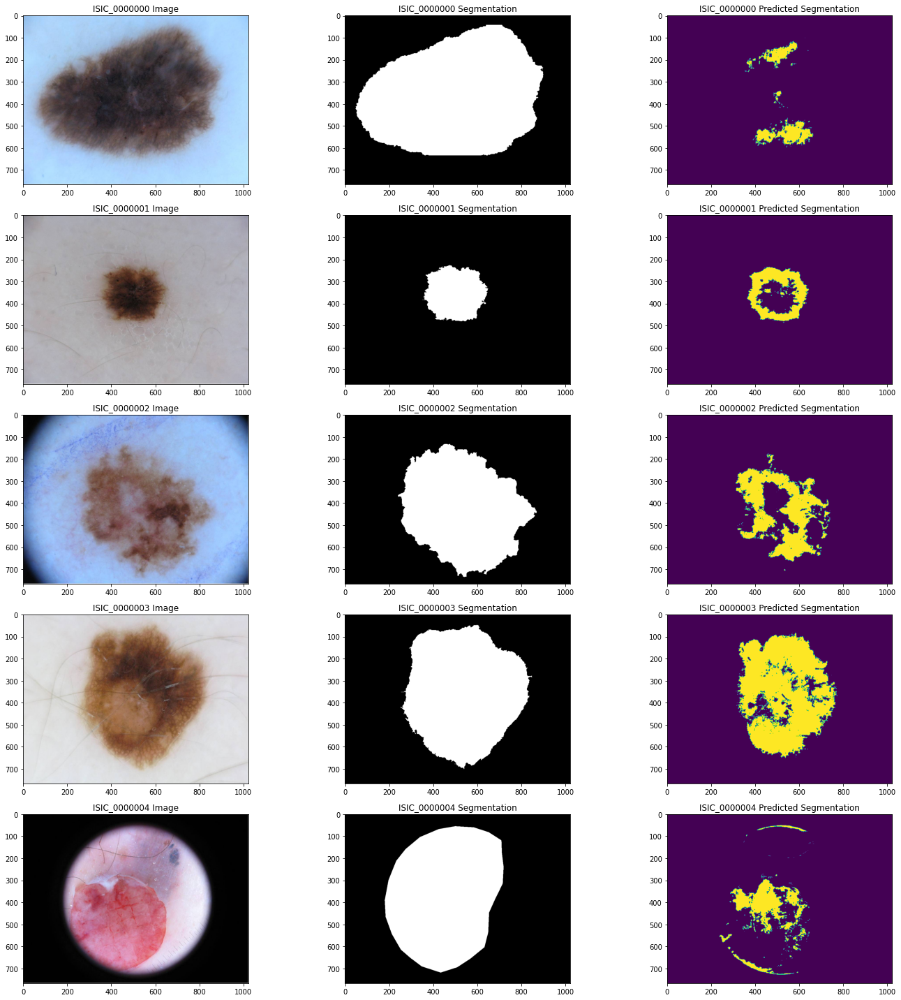

In [ ]:
##Import necessary plotting package
import matplotlib.pyplot as plt

##Create figure to output images onto
rows = 5
columns = 3
fig, ax = plt.subplots(rows,columns,figsize=(20,20))

##Iterate through the first ten images in dictionary and display results
ct = 0
for i in images.keys():

  ##Plot the melanoma image and its segmentation
  ax[ct,0].imshow(images[i])
  ax[ct,1].imshow(segmentations[i],cmap='gray')
  ax[ct,2].imshow(makeSegmentation(images[i],rbf[2]))

  ##Set the titles
  ax[ct,0].set_title(i+' Image')
  ax[ct,1].set_title(i+' Segmentation')
  ax[ct,2].set_title(i+' Predicted Segmentation')
  
  ##Logic to keep loop going until we've plotted all observations
  if ct == 4:
    break
  else:
    ct+=1

##Format the plot
fig.tight_layout()

The SVM results above aren't terrible, but they also aren't great. Here are a few encouraging/discouraging observations:
* In ISIC_00000003 the SVM shows effective in semantic segmentation by roughly generating the same shaped lesion as the ground truth, however it is misclassifying area within the lesion 
* ISIC_0000004 is an interesting case and is understandabley hard for the SVM to make predictions on given how simple our covariates were. 
* ISIC_0000000, for this image the SVM really gives no predictive value in terms of our semantic segmentation task, it fails to classify the body of the lesion

Overall, this experiment shows us that this naive SVM approach to semantic segmentation is not a reliable solution to use for skin cancer lesion segmentation. This is problematic because researchers need to use very detailed and accurate segmentations in order to study different skin cancers and possibly make predictions on whether something is melanoma or not. 

### Building a U-NET Segmentation Model

In order to build the U-Net model, I followed along with this keras sponsored implementation and made some small architecture changes to ensure it worked for the ISIC Archive data. https://keras.io/examples/vision/oxford_pets_image_segmentation/

After experimenting with SVM's, I have formulated the two hypothesis on why a U-Net semantic segmentation will boost performance of segmentation on this task. 
* By using deep learning, the network will learn more complex features than we used in the SVM and potentially better classify things like the camera lens
* Since we really only have a binary semantic segmentation problem, U-Net should have a relatively easy time finding a lesion and then determining where the pixels are. Specifically as discussed in class, U-Net was designed for medical applications, so ideally it will fit well on Skin cancer data. 

Below the keras implementation is defined:

In [ ]:
from tensorflow.keras import layers
import tensorflow as tf

def get_model(img_size, num_classes):
    inputs = tf.keras.Input(shape=img_size + (3,))

    # Entry block
    x = layers.Conv2D(32, 3, strides=2, padding="same")(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    # Set aside residual
    previous_block_activation = x 

    # Blocks 1, 2, 3 are identical apart from the feature depth
    for filters in [64, 128, 256]:
        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

        # Project residual
        residual = layers.Conv2D(filters, 1, strides=2, padding="same")(
            previous_block_activation
        )
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    ### [Second half of the network: upsampling inputs] ###

    for filters in [256, 128, 64, 32]:
        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.UpSampling2D(2)(x)

        # Project residual
        residual = layers.UpSampling2D(2)(previous_block_activation)
        residual = layers.Conv2D(filters, 1, padding="same")(residual)
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    # Add a per-pixel classification layer
    outputs = layers.Conv2D(num_classes, 3, activation="softmax", padding="same")(x)

    # Define the model
    model = tf.keras.Model(inputs, outputs)
    return model

# Build model
model = get_model((256,256), 2)
model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 32  896         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 128, 128, 32  128        ['conv2d[0][0]']                 
 alization)                     )                                                             

In order for the ISIC Archive data to be compatible with this dataset, the code below will alter both the images and their corresponding segmentations in the following ways:
* Images will be normalized so their channels are scaled from 0-1
* Images and Segmentations will be re-sized to 256x256. This is because all the ISIC images are of different sizes and high resolution, so I'd like to retain a decently high-resolution with 256x256 dimensions, and as well U-Net obviosuly requires all input be of the same size.
* Segmentation dimensions are expanded to be correctly formatted for the logit predictions
* Segmentations were made completely binary 

In [ ]:
##Import necessary package for changing image resolution
import cv2

##New storage variables
imgData = []
segData = []

##Change resolution of images
for i in images:

  ##Resize the segmentation and the image
  images[i] = (images[i]/255).astype('float32')
  newImg = cv2.resize(images[i], (256,256), interpolation = cv2.INTER_AREA)
  newSeg = cv2.resize(segmentations[i], (256,256), interpolation = cv2.INTER_AREA)
  newSeg = np.expand_dims(newSeg,2)
  newSeg = np.expand_dims(newSeg,2)
  newSeg[newSeg>0] = 1

  ##Add the resized data to the lists
  imgData.append(newImg)
  segData.append(newSeg)

##Free up RAM
del images
del segmentations

##Reformat as numpy arrays
imgData = np.array(imgData)
segData = np.array(segData)

Split the data into a Train/Validation and Test set. 

In [ ]:
##Split the model into a training/validation and test
from sklearn.model_selection import train_test_split
x_train_val, x_test, y_train_val, y_test = train_test_split(imgData, segData, test_size=0.10, random_state=42)

##Now split the data even further to a train and validation
x_train, x_val, y_train, y_val = train_test_split(x_train_val, y_train_val, test_size=0.8, random_state=42)

Now we will compile the model using RMSProp as the optimizer. I am training the model over 100 epochs and a batch size of 32. 

In [ ]:
##Compile the model
model.compile(optimizer="rmsprop", loss="sparse_categorical_crossentropy")

##Fot the super-resolution model
model.fit(x_train,y_train,epochs=100,batch_size=32,validation_data=(x_val, y_val))

Epoch 1/100
3/3 [==============================] - 7s 857ms/step - loss: 0.8426 - val_loss: 1.6273
Epoch 2/100
3/3 [==============================] - 2s 575ms/step - loss: 0.3279 - val_loss: 1.1058
Epoch 3/100
3/3 [==============================] - 2s 575ms/step - loss: 0.4063 - val_loss: 1.1267
Epoch 4/100
3/3 [==============================] - 2s 578ms/step - loss: 0.2296 - val_loss: 1.0695
Epoch 5/100
3/3 [==============================] - 1s 576ms/step - loss: 0.2430 - val_loss: 0.8450
Epoch 6/100
3/3 [==============================] - 1s 576ms/step - loss: 0.2562 - val_loss: 0.8867
Epoch 7/100
3/3 [==============================] - 2s 579ms/step - loss: 0.2123 - val_loss: 0.8020
Epoch 8/100
3/3 [==============================] - 2s 580ms/step - loss: 0.2124 - val_loss: 0.9269
Epoch 9/100
3/3 [==============================] - 2s 572ms/step - loss: 0.1441 - val_loss: 0.7268
Epoch 10/100
3/3 [==============================] - 1s 570ms/step - loss: 0.2110 - val_loss: 0.9265
Epoch 11/

We can see that we get a pretty good validation loss at the conclusion of training. We can note that there was some over-fitting when transitioning from the train set to the validation set. The final train loss was .08, while the final validation loss was .2404. 

Below let's display how the model performs on the test data to get a better assessment of how bad the over-fitting might have been:

Now lets evaluate what our test loss is to assess if the model overfit:

In [ ]:
##Display the test loss for our model
print('Test Results for U-Net Model (Over-Fitting Check)')
model.evaluate(x_test, y_test, verbose=0)

Test Results for U-Net Model (Over-Fitting Check)


0.15474890172481537

The test set loss results of 0.155 is great to see and it indicates that over-fitting may not be an issue afterall. The loss from the validation set of the final epoch was 0.24, so this test loss is actually an improvement. As well, the train loss at the final epoch was 0.08, so the test loss of 0.155 is not a dramatic enough increase for me to be overly worried about over-fitting of the U-Net model. 

Now that we have these numerical results, lets examine a large sample of visual results of the U-Net model on this skin cancer segmentation task. 

<b>Display the U-Net Predictions</b>

Below I have created 4 subplots. Each subplot contains 10 predicted test observations. The reasoning for this is I tried to fit all the predictions on 1 graph and collab kept crashing for "unknown" reasons, perhaps Collab's GPU didn't like the image resolutions when graphing. 

I have created a summarization text section directly following these visual results. 

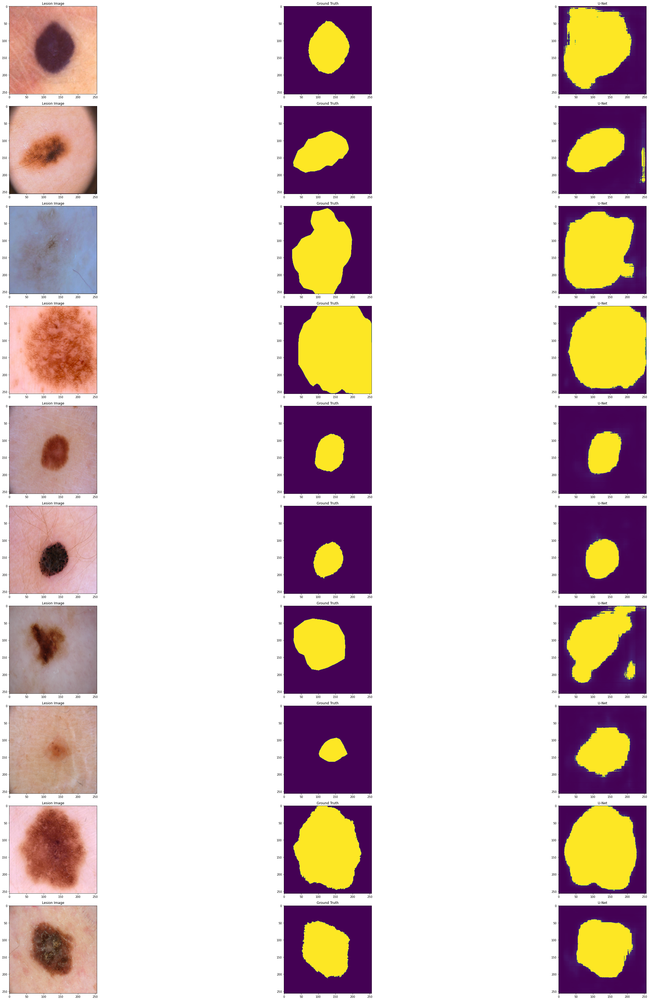

In [ ]:
##Import necessary plotting package
import matplotlib.pyplot as plt

##Make predictions on the test data
preds = model.predict(x_test)

##Create figure to output images onto
rows = 10
columns = 3
fig, ax = plt.subplots(rows,columns,figsize=(50,50))

##Display all images in the test data
ct = 0
for i in range(10):

  ##Plot the image and its corresponding U-net segmentation
  ax[ct,0].imshow(x_test[i])
  ax[ct,1].imshow(np.squeeze(y_test[i]))
  segPred = cv2.split(preds[i])[1]
  segPred[segPred>.1]=1
  ax[ct,2].imshow(segPred)

  ##Add titles to each plot
  ax[ct,0].set_title('Lesion Image')
  ax[ct,1].set_title('Ground Truth')
  ax[ct,2].set_title('U-Net')

  ##Iterate the axis counter
  ct+=1

##Format the figure 
fig.subplots_adjust(wspace=0, hspace=0)
fig.tight_layout()

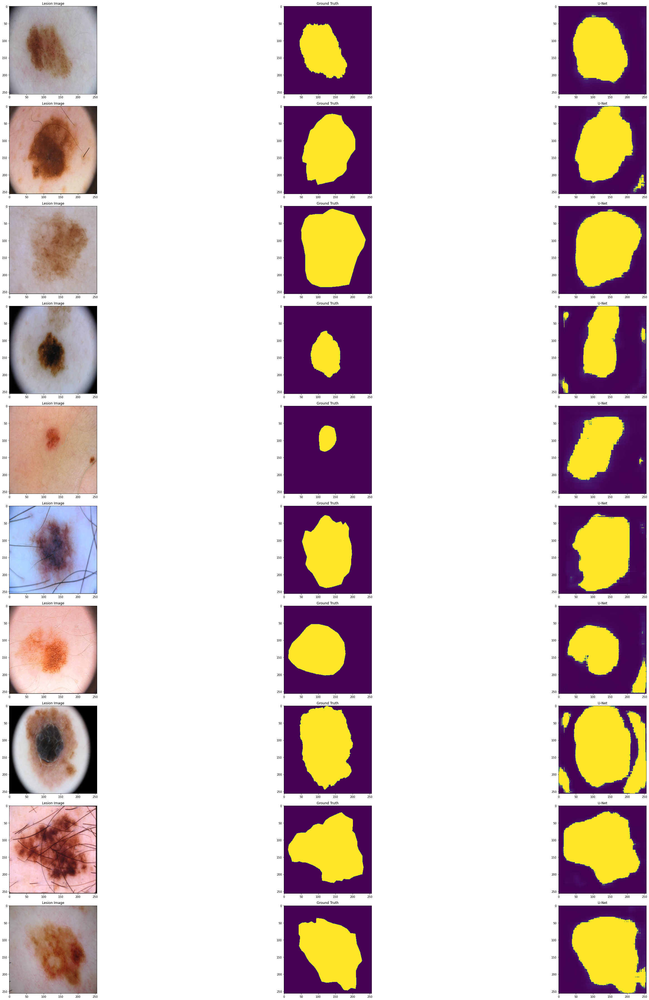

In [ ]:
##Create figure to output images onto
rows = 10
columns = 3
fig, ax = plt.subplots(rows,columns,figsize=(50,50))

##Display all images in the test data
ct = 0
for i in range(10,20):

  ##Plot the image and its corresponding U-net segmentation
  ax[ct,0].imshow(x_test[i])
  ax[ct,1].imshow(np.squeeze(y_test[i]))
  segPred = cv2.split(preds[i])[1]
  segPred[segPred>.1]=1
  ax[ct,2].imshow(segPred)

  ##Add titles to each plot
  ax[ct,0].set_title('Lesion Image')
  ax[ct,1].set_title('Ground Truth')
  ax[ct,2].set_title('U-Net')

  ##Iterate the axis counter
  ct+=1

##Format the figure 
fig.subplots_adjust(wspace=0, hspace=0)
fig.tight_layout()

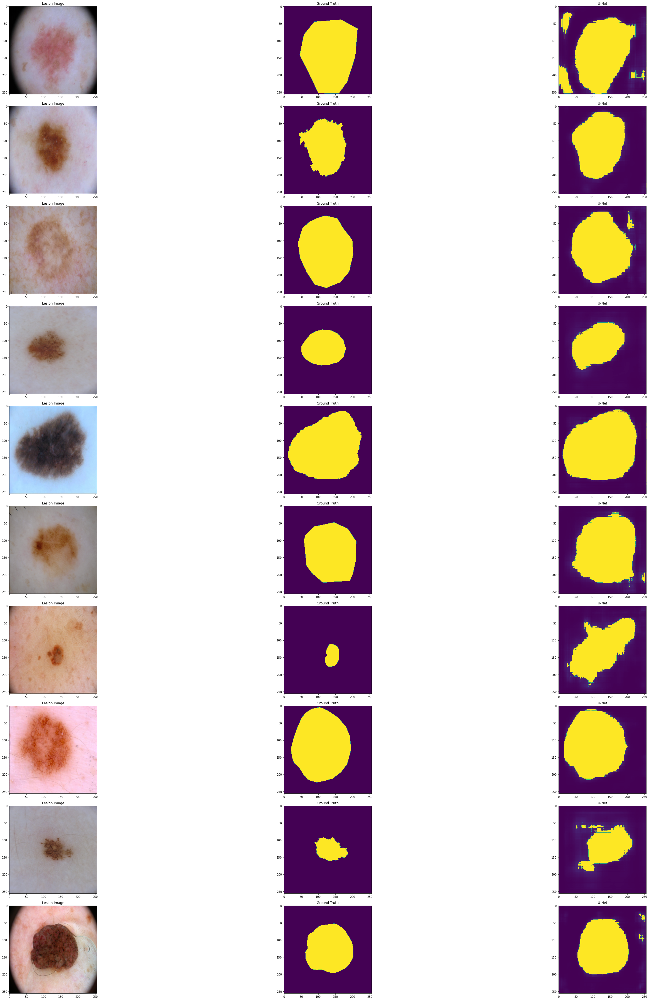

In [ ]:
##Create figure to output images onto
rows = 10
columns = 3
fig, ax = plt.subplots(rows,columns,figsize=(50,50))

##Display all images in the test data
ct = 0
for i in range(20,30):

  ##Plot the image and its corresponding U-net segmentation
  ax[ct,0].imshow(x_test[i])
  ax[ct,1].imshow(np.squeeze(y_test[i]))
  segPred = cv2.split(preds[i])[1]
  segPred[segPred>.1]=1
  ax[ct,2].imshow(segPred)

  ##Add titles to each plot
  ax[ct,0].set_title('Lesion Image')
  ax[ct,1].set_title('Ground Truth')
  ax[ct,2].set_title('U-Net')

  ##Iterate the axis counter
  ct+=1

##Format the figure 
fig.subplots_adjust(wspace=0, hspace=0)
fig.tight_layout()

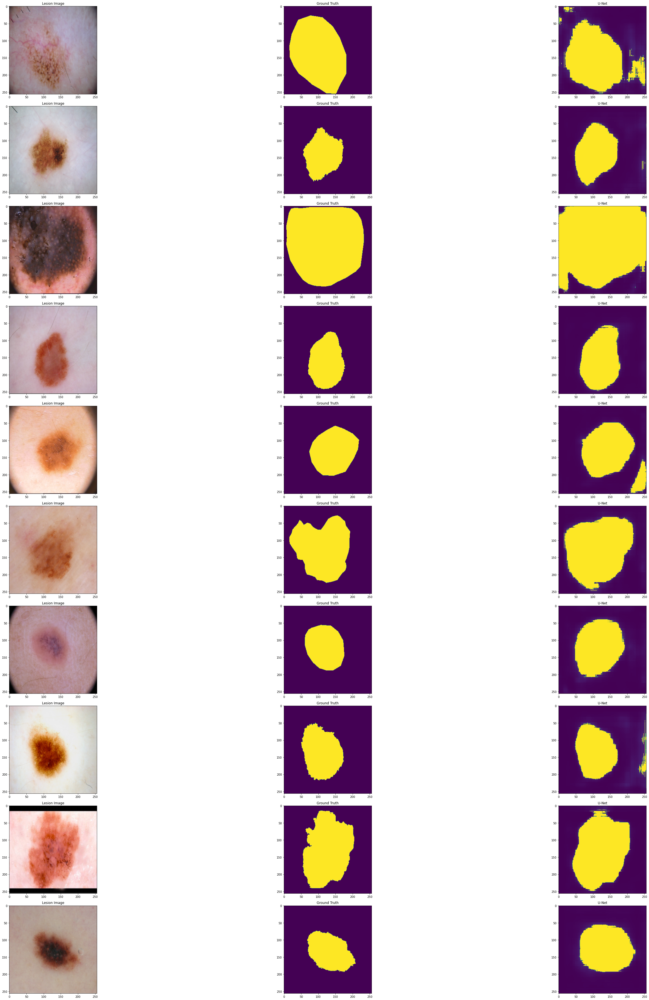

In [ ]:
##Create figure to output images onto
rows = 10
columns = 3
fig, ax = plt.subplots(rows,columns,figsize=(50,50))

##Display all images in the test data
ct = 0
for i in range(30,40):

  ##Plot the image and its corresponding U-net segmentation
  ax[ct,0].imshow(x_test[i])
  ax[ct,1].imshow(np.squeeze(y_test[i]))
  segPred = cv2.split(preds[i])[1]
  segPred[segPred>.1]=1
  ax[ct,2].imshow(segPred)

  ##Add titles to each plot
  ax[ct,0].set_title('Lesion Image')
  ax[ct,1].set_title('Ground Truth')
  ax[ct,2].set_title('U-Net')

  ##Iterate the axis counter
  ct+=1

##Format the figure 
fig.subplots_adjust(wspace=0, hspace=0)
fig.tight_layout()

<b>Observations from using U-Net:</b>

Looking at the visual results above, I am extremely happy with the output. We can observe visually that the U-Net model is much more suitable for the skin cancer semantic segmentation task that the simple SVM using tabular data was. 

These results are also encouraging givent that the model only had about 350 images to train on because of RAM limitations and the train/test split. This indicates, that giving this model a significant amount more of data would yeild even more results. 

Some observations:
* U-Net is far superior than the SVM model at capturing the true shape of the lesion during semantic segmentation
* In the 2nd subplot from the top, we can observe that at several instances, U-Net classifies the camera lens as part of the lesion, which is problematic but should be fixable by using more data during training (thus creating a more robust U-Net)
* In the last subplot, we can notice a few U-Net segmentations with random splotches of yellow, which again seems fixable by using more data
* U-Net appears to be fairly robust to random noise like hair in the images, we can observe in the 2nd subplot from the top, that there are several images with hair, and the U-Net does not appear to misclassify hair as being part of the lesion, which is desireable

## Final Thoughts

Overall, I enjoyed doing this notebook on semantic segmentation. In my last report I heavily focused on <b>Depth Estimation</b> and <b>Super-Resolution</b> so I felt I skipped over semantic segmentation and needed to re-visit it this week to become more knowledgable about it. 

Additionally, by contrasting the results of a SVM using tabular pixel data for semantic segmentation and using a deep learning U-Net approach, it became obvious to me that when it comes to image segmentation, deep learning approaches are truly state of the art. The U-Net significantly out-performed the naive approach and was generalizble to the test data after only having been trained on 350 images. In the future, I would certainly enhance this task by using thousands of image (if I can get the RAM resources) and I would expect the results to be even better. 